In [1]:
# Registering high resolution image to the HLAVL template

In [2]:
import ants
import numpy as np
import matplotlib.pyplot as plt
import os
%matplotlib inline

In [3]:
# Machine specific setup of folder names
#-------------------------------------------------------------------------------------------------
import getpass
if getpass.getuser() == 'roschkoenig':
    Fimg = '/Users/roschkoenig/Dropbox/Research/1805 Seizure segment/Dylan Registration/Zebrafish'
    fipath = Fimg + os.sep + 'Elavl3-H2BRFP.tif'
    mopath = Fimg + os.sep + 'Substack_Red_large.tif'
else:
    fipath = '/home/dylan/Elavl3-H2BRFP.tif'
    mopath = '/home/dylan/Desktop/Lab/Substack_Red_large.tif'


In [4]:
# Prepare template
fi = ants.image_read(fipath)
mo = ants.image_read(mopath)

In [5]:
mo.set_direction(np.array([[-1., 0., 0.],[0., 1., 0.],[0., 0., 1.]]))
mo.set_origin((1000,0,100))

In [6]:
fi.set_spacing(list([0.798, 0.798,2.0]))
mo.set_spacing(list([.4,.4, 8]))

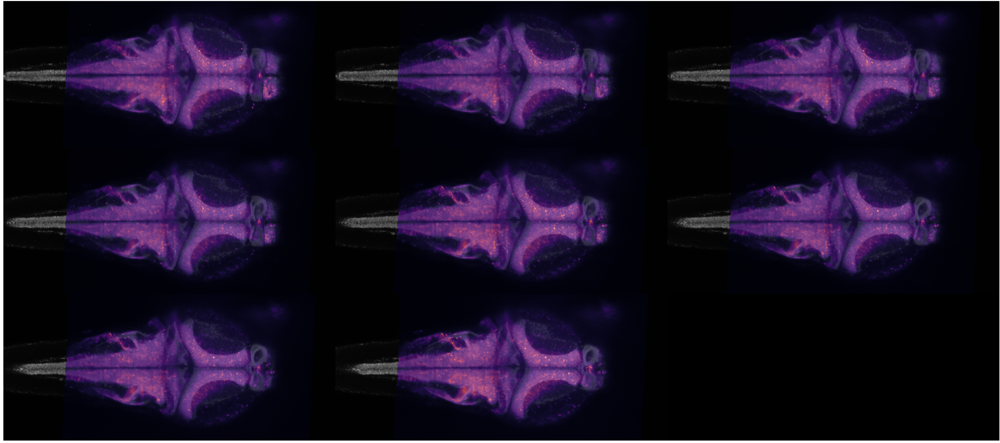

In [15]:
# ants.plot(mr_r,fi, overlay_cmap = 'magma', overlay_alpha = .7, axis = 2, figsize = 20, slices = [x for x in range(8)])
ants.plot(fi, mr_r, overlay_cmap = 'magma', overlay_alpha = .75, axis = 2, slices = [x+100 for x in range(8)], figsize = 20)

In [34]:
ants.image_physical_space_consistency(fi, mo)

False

In [7]:
# Rigid
mrtr_r = ants.registration(fi, mo, type_of_transforms = 'Rigid')
mr_r   = ants.apply_transforms(fi, mo, transformlist=mrtr_r['fwdtransforms'])